<a href="https://colab.research.google.com/github/omarkhaled00/generative-license-plate-blurring-/blob/main/FULL_Pipline_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Run theis if you didn't run before

In [ ]:
# !pip install ultralytics
# !pip install diffusers
# !pip install accelerate



ADD the path of the oringal image then create path for the mask , inpainting ,super-resolution and Result.

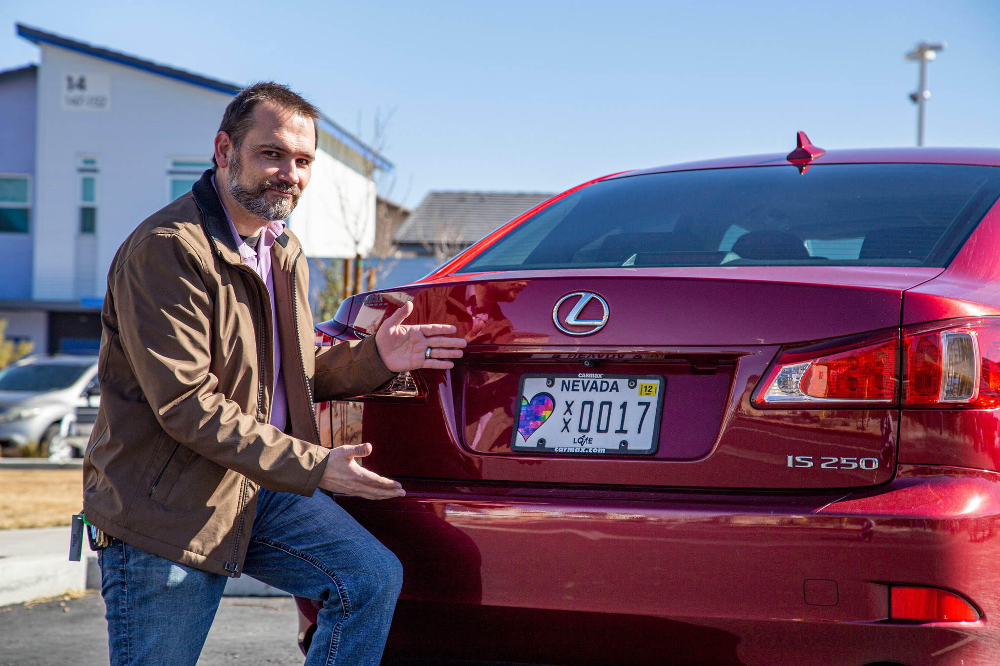

In [ ]:
from PIL import Image
opath='personalized-license-plates.jpeg'
mask_path = 'mask_personalized-license.png'
biggpath ='inp_personalized-license.png'
uppath="SuRe_personalized-license.png"
result_image_path = 'result_personalized-license.jpg'
oo = Image.open(opath)
oo


0: 448x640 1 License_Plate, 123.1ms
Speed: 7.2ms preprocess, 123.1ms inference, 5.7ms postprocess per image at shape (1, 3, 448, 640)
0


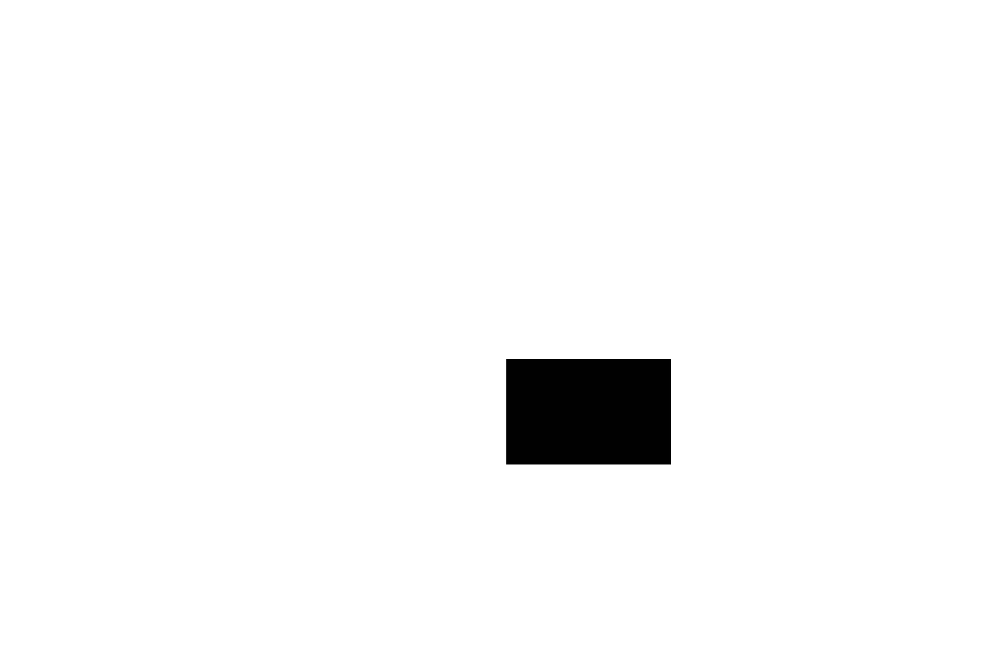

In [ ]:
from ultralytics.utils.plotting import Annotator
from ultralytics import YOLO
import cv2
import numpy as np

model = YOLO('best2.pt')  # Load  fine-tune model

# Specify the path to your image file
image_path = opath

# Load the image using OpenCV
source = cv2.imread(image_path)

# Process the image
results = model(source)

# Initialize an empty mask
combined_mask = np.zeros_like(source)

# Iterate over each bounding box in the results
for r in range(len(results[0].boxes.xyxy)):
    print(r)

    # Extract the bounding box coordinates
    box = results[0].boxes.xyxy[r].cpu().numpy()

    # Convert the coordinates to integers
    x1, y1, x2, y2 = map(int, box[:4])

    # Create a mask for the region inside the bounding box
    mask = np.zeros_like(source)
    cv2.rectangle(mask, (x1, y1), (x2, y2), (255, 255, 255), -1)

    # Add the current mask to the combined mask
    combined_mask = cv2.bitwise_or(combined_mask, mask)

# Invert the combined mask so that the region inside all bounding boxes is black (0)
combined_mask = cv2.bitwise_not(combined_mask)

# Save the inverted mask for later use in inpainting

cv2.imwrite(mask_path, combined_mask)
shmask = Image.open(mask_path)
shmask

Here where the inpating model get both the orginal image and the mask to use to remove the license plate.

diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/23300 [00:00<?, ?it/s]

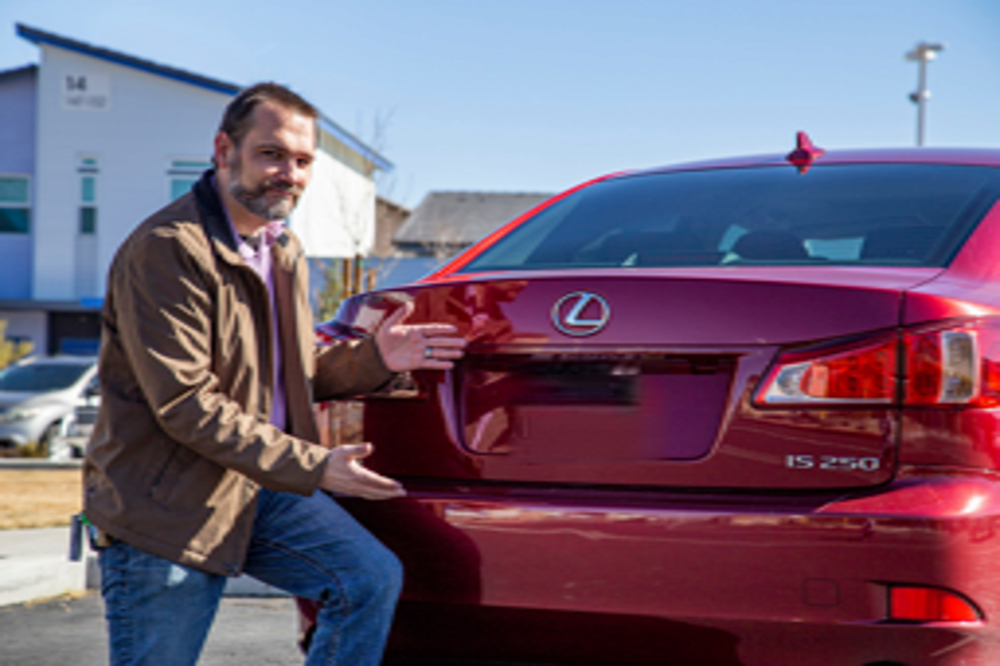

In [ ]:
import torch
import PIL
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import PIL.ImageOps

from diffusers import RePaintPipeline, RePaintScheduler

original= PIL.Image.open(opath)
# Load the original image and the mask as PIL images
original_image = PIL.Image.open(opath).resize((256, 256))
mask_image = PIL.Image.open(mask_path).resize((256, 256))


# Convert PIL images to NumPy arrays
original_np = np.array(original_image)
mask_np = np.array(mask_image)

# Convert NumPy arrays to PyTorch tensors
original_tensor = torch.tensor(original_np).permute(2, 0, 1).unsqueeze(0).float().to("cuda") / 255.0
mask_tensor = torch.tensor(mask_np).permute(2, 0, 1).unsqueeze(0).float().to("cuda") / 255.0

# Load the RePaint scheduler and pipeline based on a pretrained DDPM model
scheduler = RePaintScheduler.from_pretrained("google/ddpm-church-256")
pipe = RePaintPipeline.from_pretrained("google/ddpm-church-256", scheduler=scheduler)
pipe = pipe.to("cuda")

generator = torch.Generator(device="cuda").manual_seed(0)

# Apply RePaint process to the original image using the provided mask
output = pipe(
    image=original_tensor,
    mask_image=mask_tensor,
    num_inference_steps=500,
    eta=0.0,
    jump_length=25,
    jump_n_sample=25,
    generator=generator,
)

# Convert the output image to a NumPy array
final_image_np = np.array(output.images[0])

# Perform the required operations (e.g., multiplication) on the NumPy array
final_image_np = (final_image_np * 255).astype(np.uint16)

# Clip the pixel values to the valid range [0, 255]
final_image_np = np.clip(final_image_np, 0, 255)

# Convert the final image array back to a PIL image
final_image_pil = PIL.Image.fromarray(final_image_np.astype(np.uint8))



enhancer = ImageEnhance.Brightness(final_image_pil)
brightened_image = enhancer.enhance(2)  # Increase brightness by a factor of 2

# Invert the brightened image
inverted_image = PIL.ImageOps.invert(brightened_image)
image_bigger = inverted_image.resize(original.size)
# Save the inverted and brightened image

image_bigger.save(biggpath)

image_bigger


Here where the inpainted image get it's resolution incrased with the Super-Resolution Model

unet\diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

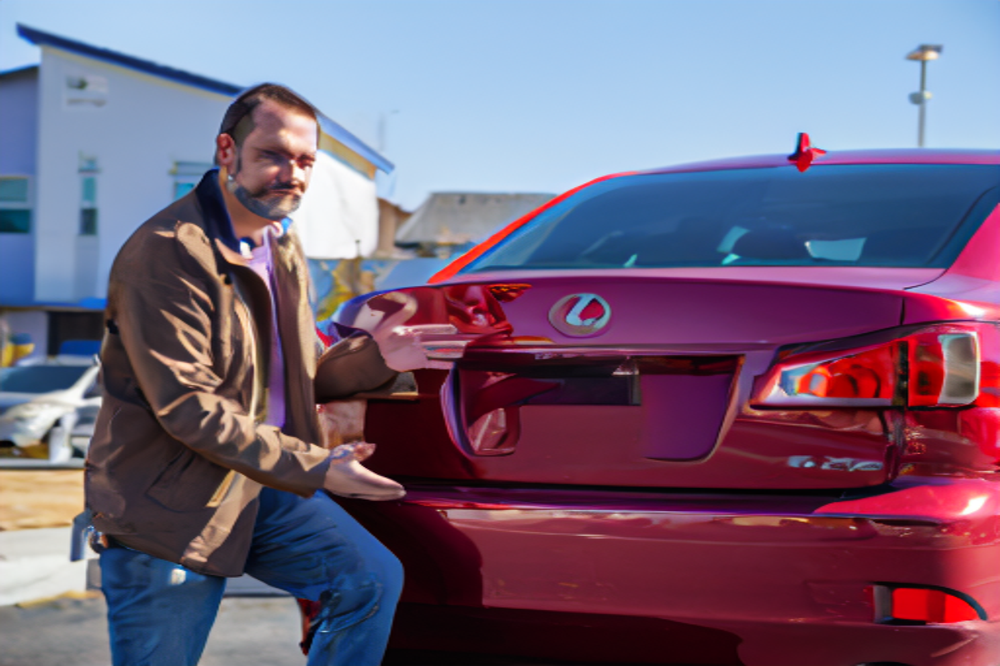

In [ ]:
from PIL import Image
from diffusers import LDMSuperResolutionPipeline
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "CompVis/ldm-super-resolution-4x-openimages"

# Load the model and move it to the appropriate device
pipeline = LDMSuperResolutionPipeline.from_pretrained(model_id)
pipeline = pipeline.to(device)

# Load the input image from the local file
input_image_path = inverted_image  # Update this with the actual path to your image file


# Resize the input image to match the expected input size of the model
input_image = inverted_image.resize((128, 128))

# Run the super-resolution pipeline on the input image
upscaled_image = pipeline(input_image, num_inference_steps=200, eta=1).images[0]

# Save the upscaled image

upscaled_image = upscaled_image.resize(original.size)

upscaled_image.save(uppath)
upscaled_image

This the final part where the sup-resl image and the orginal image get combined


image 1/1 C:\Users\omark\personalized-license-plates.jpeg: 448x640 1 License_Plate, 9.5ms
Speed: 2.0ms preprocess, 9.5ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Bounding box dimensions: (336, 215)
Modified patch dimensions: (215, 336, 3)
Resulting image saved to: result_personalized-license.jpg


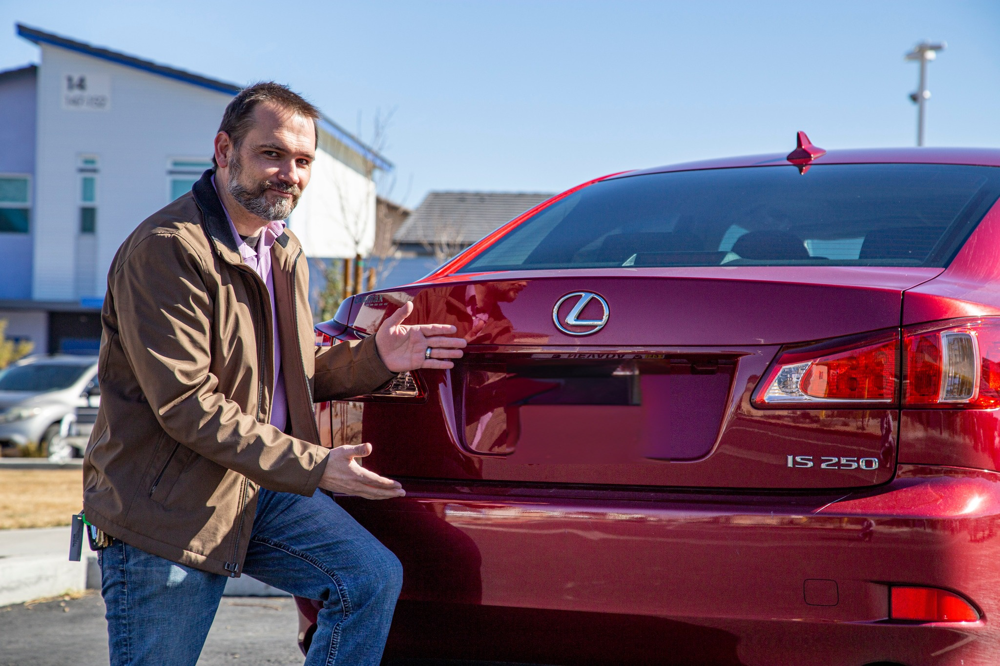

In [ ]:
from ultralytics.utils.plotting import Annotator
from ultralytics import YOLO
import cv2
import numpy as np

model = YOLO('best2.pt')  # Load  fine-tune model

# Specify the paths to your images
image_path = opath
modified_image_path = uppath

# Load the images using OpenCV
source = cv2.imread(image_path)
modified_image = cv2.imread(modified_image_path)

# Process the original image
results = model(image_path)

# Iterate over each bounding box in the results
for r in range(len(results[0].boxes.xyxy)):
    # Extract the bounding box coordinates
    box = results[0].boxes.xyxy[r].cpu().numpy()
    x1, y1, x2, y2 = map(int, box[:4])

    # Crop the modified image to fit inside the bounding box
    modified_patch = modified_image[y1:y2, x1:x2]

    # Debug print statements
    print("Bounding box dimensions:", (x2 - x1, y2 - y1))
    print("Modified patch dimensions:", modified_patch.shape)

    # Ensure the modified patch and the bounding box have the same dimensions
    if modified_patch.shape[0] != (y2 - y1) or modified_patch.shape[1] != (x2 - x1) or modified_patch.size == 0:
        print("Resizing modified patch to match bounding box dimensions.")
        modified_patch = cv2.resize(modified_patch, (x2 - x1, y2 - y1))

    # Overlay the modified patch onto the original image
    source[y1:y2, x1:x2] = modified_patch


#  save the resulting image

cv2.imwrite(result_image_path, source)
print("Resulting image saved to:", result_image_path)
f = Image.open(result_image_path)
f